In [1]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import os
from statistics import mean
from statistics import median

In [2]:
#Main Function to run analysis
def runAnalysis(timePath, lifetimePath, SSPath, trim, minLength):
    time = list(pd.read_csv(timePath, header = None)[0])
    lifetime = list(pd.read_csv(lifetimePath, header = None)[0])
    SS = list(pd.read_csv(SSPath, header = None)[0])
    states = {'state1': [1 if i == 1 else 0 for i in SS], 'state2':[1 if i == 2 else 0 for i in SS], 
              'state3': [1 if i == 3 else 0 for i in SS], 'state4':[1 if i == 4 else 0 for i in SS]}
    stateColors = {'state1': 'green', 'state2':'blue', 
                   'state3': 'red', 'state4':'yellow'}
    print('legend: ')
    print(stateColors)
    print('Raw Data')
    plotData(time, states, lifetime, stateColors, True)
    states_analyzed, stateWindows, timeWindows = stateAnalysis(lifetime, states, time, trim, minLength)
    print('Trimmed Data')
    plotData(time, stateWindows, lifetime, stateColors, False)
    
    
    
    states_analyzed_Formatted = {key:pd.Series(value) for key, value in states_analyzed.items()}
    stateWindows_Formatted = {key:pd.Series(value) for key, value in stateWindows.items()}
    timeWindows_Formatted =  {key:pd.Series(value) for key, value in timeWindows.items() }
    
    nestedDict = {k: {'Lifetime Analysis': states_analyzed_Formatted[k], 'Index': stateWindows_Formatted[k], 'Time': timeWindows_Formatted[k]} for k in timeWindows_Formatted.keys()}
    reformed_dict = {}
    for outerKey, innerDict in nestedDict.items():
        for innerKey, values in innerDict.items():
            reformed_dict[(outerKey,
                           innerKey)] = values
    pd.options.display.max_seq_items = 2000        
    results_df = pd.DataFrame(reformed_dict)

    return results_df

    
#Takes in data, omits epochs too short, trims transition periods, analyzes epochs after trimming. 
def stateAnalysis(lifetime, stateData, time, trim, minLength):
    states_analyzed = {}
    stateWindows = {}
    timeWindows = {}
    for key in stateData:
        analyzedWindows = []
        changes = stateChanges(stateData[key])
        

        #omit epochs too short, analyze windows long enough
        i = 0
        while i < len(changes):
            if time[changes[i][1]]-time[changes[i][0]]<minLength:
                changes.remove(changes[i]) #removing epochs too short
            else:
                #trimming ends of epochs
                changes[i][0] = find_nearest(time, time[changes[i][0]]+trim) 
                changes[i][1] = find_nearest(time, time[changes[i][1]]-trim) 
                #analyzedWindows.append(max_surroundMean(lifetime[changes[i][0]:changes[i][1]], 1))
                if len(lifetime[changes[i][0]:changes[i][1]])>1:
                    analyzedWindows.append(median(lifetime[changes[i][0]:changes[i][1]]))
                i+=1
        states_analyzed[key] = analyzedWindows
        stateWindows[key] = changes
        np.save((path + 'results/' + key + 'test.npy'),changes)
        timeWindows[key] = [[time[i[0]],time[i[1]]] for i in changes]
    return states_analyzed, stateWindows, timeWindows
   
#Takes in a list, finds average of max value and n surrounding data points
def max_surroundMean(data, n):
    maxIDX = data.index(max(data))    
    if maxIDX == 0:
        maxIDX = n
    elif maxIDX == len(data)-1:
        maxIDX = maxIDX-n
    return mean(data[maxIDX-n:maxIDX+n+1])
        
#returns index of closest corresponding value in the array 
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
        
#Returns list of pairs (index) [[start, stop], [start, stop]] for all "true" periods
def stateChanges(data):
    currState = data[0]
    if currState:
        temp = [0]
    changes = []
    for i in range(len(data)):
        if data[i] != currState:
            currState = data[i]
            if currState:
                temp = [i]
            else:
                temp.append(i-1)
                changes.append(temp)
        #if you reach the end of the time series
        elif data[i] and i == (len(data)-1):
                temp.append(i)
                changes.append(temp)
        else:
            pass
    
    return changes
    
def plotData(time, states, lifetime, stateColors, rawStates):
    fig, ax1 = plt.subplots(figsize=(200, 10))
    ax1.plot(time, lifetime)
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel('Lifetime (ns)')
    for key in states:
        if rawStates:
            changes = stateChanges(states[key])
            for i in changes:
                ax1.axvspan(time[i[0]], time[i[1]], color=stateColors[key], alpha=0.5)
        else:
            for i in states[key]:
                ax1.axvspan(time[i[0]], time[i[1]], color=stateColors[key], alpha=0.5)
            
    plt.show()
    


In [6]:
    #path = '20220214_1610_SW_001_analysis_csv_20220426/'
    #path = '20220219_1610_SW_002_analysis_csv_20220426/'
    #path = '20220301_1612_SW_003_analysis_csv_20220426/'
    #path = '20220302_1611_SW_003_analysis_csv_20220426/'
    #path = '20220304_1630_SW_002_analysis_csv_20220426/'
    #path = '20220312_1629_SW_002_analysis_csv_20220426/'
    #path = '20220313_1626_SW_002_analysis_csv_20220426/'
    #path = '20220314_1610_SW_003_analysis_csv_20220426/'
    #path = '20220315_1612_SW_004_analysis_csv_20220426/'
    #path = '20220316_1611_SW_004_analysis_csv_20220426/'
    #path = '20220317_1627_SW_002_analysis_csv_20220426/'
    
    #path = '20220318_1626_SW_003_analysis_csv_20220426/'
    #path = '20220319_1630_SW_003_analysis_csv_20220426/'
    #path = '20220322_1627_SW_003_analysis_csv_20220426/'
    #path = '20220323_1629_SW_003_analysis_csv_20220426/'
    #path = '20220324_1612_SW_005_analysis_csv_20220426/'
    #path = '20220325_1611_SW_005_analysis_csv_20220426/'
    #path = '20220328_1610_SW_005_analysis_csv_20220426/'
    #path = '20220329_1626_SW_004_analysis_csv_20220426/'
    #path = '20220330_1630_SW_004_analysis_csv_20220426/'
    #path = '20220331_1629_SW_004_analysis_csv_20220426/'
    #path = '20220402_1627_SW_004_analysis_csv_20220426/'
    path = '20220712_PM29_111_Achmut_001_analysis_csv_20220830/'
    path = '/Users/pingchuanma/Desktop/ChenLab_Data/FLP_data_sleep/ACh_mut/20220425_109_AChmut_SW_001_analysis_csv_20220510/'
    
    
    
    
    os.mkdir(path + 'results')

In [10]:
#Parameters
timePath = path + 'time.csv'
lifetimePath = path + 'lft_emp.csv'
statesPath = path + 'states.csv'


trim = 12               #how much to trim from beginning/end of epochs
minLength = 16+(2*trim) #minimum length of epochs to include 
                        #(length before trimming, so if you want 10 secopnds minimum then use 10+(2*trim) as the value)

#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time
    


legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


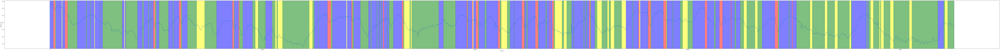

Trimmed Data


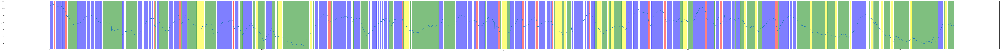

In [11]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimePath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_epoch_analysis.csv'),index=False)

In [12]:
results

state1                                            state2  \
   Lifetime Analysis         Index              Time Lifetime Analysis   
0             4.1487   [834, 1251]   [852.2, 1278.4]            4.1752   
1             4.1404  [2422, 3290]  [2496.1, 3392.9]            4.1728   
2             4.1370  [3476, 3996]  [3582.7, 4113.5]            4.1701   
3             4.1432  [4248, 4278]  [4370.6, 4401.2]            4.1536   
4             4.1457  [4830, 4863]  [4967.1, 5001.4]            4.1593   
..               ...           ...               ...               ...   
66               NaN           NaN               NaN            4.1594   
67               NaN           NaN               NaN            4.1563   
68               NaN           NaN               NaN            4.1551   
69               NaN           NaN               NaN            4.1607   
70               NaN           NaN               NaN            4.1414   

                                                  state3                \
             Index                Time Lifetime Analysis         Index   
0        [12, 154]      [13.12, 158.0]           4.16915    [179, 229]   
1       [281, 538]     [287.56, 549.8]           4.16070    [716, 809]   
2       [583, 691]     [595.7, 705.86]           4.14860  [4757, 4805]   
3     [1276, 1655]    [1304.2, 1698.0]           4.15240  [5910, 5977]   
4     [1710, 1851]    [1755.2, 1902.0]           4.14800  [8358, 8396]   
..             ...                 ...               ...           ...   
66  [33761, 33855]  [34792.0, 34890.0]               NaN           NaN   
67  [33907, 34060]  [34944.0, 35103.0]               NaN           NaN   
68  [36610, 37254]  [37723.0, 38393.0]               NaN           NaN   
69  [37321, 37340]  [38463.0, 38482.0]               NaN           NaN   
70  [40544, 40775]  [41781.0, 42021.0]               NaN           NaN   

                                state4                                      
                Time Lifetime Analysis           Index                Time  
0    [183.5, 234.52]           4.14420    [6721, 7053]    [6928.5, 7267.2]  
1    [731.36, 826.7]           4.14180    [9394, 9488]    [9681.3, 9779.2]  
2   [4891.3, 4941.1]           4.12990  [10301, 10341]  [10619.0, 10659.0]  
3   [6090.9, 6160.6]           4.12960  [10416, 10603]  [10736.0, 10927.0]  
4   [8603.8, 8643.3]           4.13575  [11868, 11986]  [12220.0, 12343.0]  
..               ...               ...             ...                 ...  
66               NaN               NaN             NaN                 NaN  
67               NaN               NaN             NaN                 NaN  
68               NaN               NaN             NaN                 NaN  
69               NaN               NaN             NaN                 NaN  
70               NaN               NaN             NaN                 NaN  

[71 rows x 12 columns]

In [13]:
#Parameters
timePath = path + 'time.csv'
lifetimeDCPath = path + 'lft_emp_DC.csv'
statesPath = path + 'states.csv'


#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


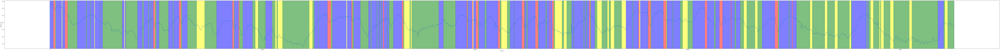

Trimmed Data


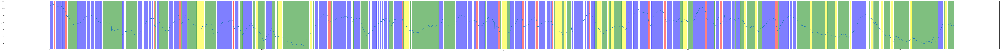

In [14]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimeDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_DC_epoch_analysis.csv'),index=False)

In [15]:
#Parameters
timePath = path + 'time.csv'
lifetimeACPath = path + 'lft_emp_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


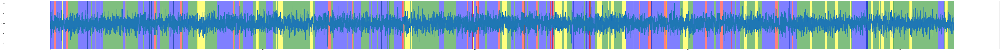

Trimmed Data


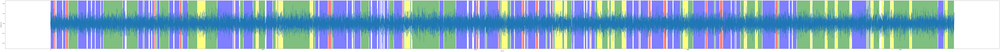

In [16]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimeACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_AC_epoch_analysis.csv'),index=False)

In [17]:
#Parameters
timePath = path + 'time.csv'
intensityPath = path + 'intensity.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


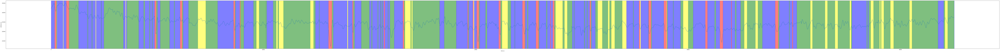

Trimmed Data


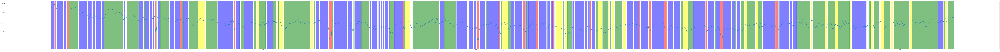

In [18]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_epoch_analysis.csv'),index=False)

In [19]:
#Parameters
timePath = path + 'time.csv'
intensityDCPath = path + 'intensity_DC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


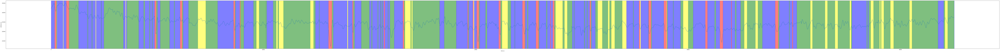

Trimmed Data


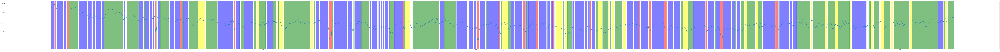

In [20]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_DC_epoch_analysis.csv'),index=False)

In [21]:
#Parameters
timePath = path + 'time.csv'
intensityACPath = path + 'intensity_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


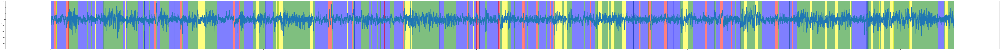

Trimmed Data


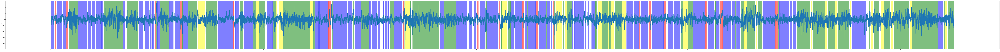

In [22]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_AC_epoch_analysis.csv'),index=False)

In [23]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitPath = path + 'lft_fit.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


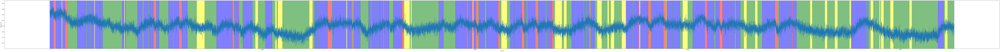

Trimmed Data


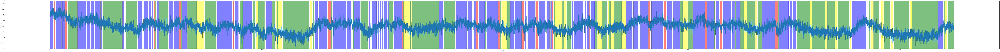

In [24]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_epoch_analysis.csv'),index=False)

In [25]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitDCPath = path + 'lft_fit_DC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


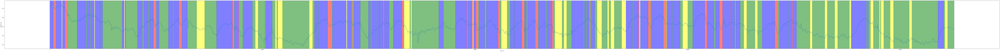

Trimmed Data


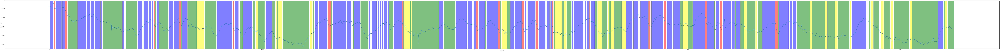

In [26]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_DC_epoch_analysis.csv'),index=False)

In [27]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitACPath = path + 'lft_fit_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


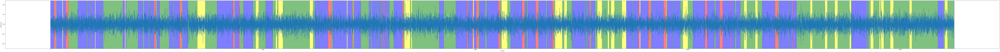

Trimmed Data


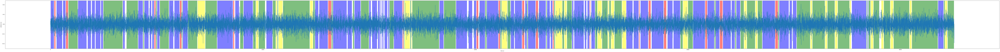

In [28]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_AC_epoch_analysis.csv'),index=False)